# ResolVI to address noise and biases in spatial transcriptomics
In this tutorial, we go through the steps of training resolVI for correction in cellular-resolved spatial transcriptomics. This addresses erroneous co-expression pattern after cellular segmentation as well as unspecific background in these technologies. We highly recommend to optimize cell segmentation before running resolVI as a better cell segmentation will also yield better downstream results and both steps are complementary.

Plan for this tutorial:

1. Loading the data
2. Training an unsupervised and (semi-)supervised resolVI model
3. Visualizing the latent space
4. Transfer mapping.
5. Generating corrected counts and perform DE analysis

In [38]:
# Install from GitHub for now
!pip install --quiet scvi-colab
!pip install --quiet decoupler
!pip install --quiet adjustText
from scvi_colab import install

install()

/home/access/.conda/envs/scvi/lib/python3.12/site-packages/scvi_colab/_core.py:41: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


In [39]:
import os
import tempfile

import decoupler as dc
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import scvi

sc.set_figure_params(figsize=(4, 4))
save_dir = tempfile.TemporaryDirectory()
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.3.0


In [40]:
# Quickly check the correct folder is used.
scvi.__file__

'/home/access/.conda/envs/scvi/lib/python3.12/site-packages/scvi/__init__.py'

## Data Loading

For the purposes of this notebook, we will be loading a Xenium dataset of a mouse brain. We will use the left hemisphere for model training and the right hemisphere for transfer mapping.
The data was originally labeled using Leiden clustering of an optimized segmentation using the [ProSeg](https://www.biorxiv.org/content/10.1101/2024.04.25.591218v1) algorithm, which is a scalable algorithm for transcriptome-informed segmentation.

In [45]:
adata_path = os.path.join(save_dir.name, "xenium_tutorial.h5ad")
adata = sc.read(adata_path, backup_url="https://figshare.com/ndownloader/files/49710699")
adata

  0%|          | 0.00/170M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 130604 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred'
    layers: 'counts'

We computed a UMAP after transfering labels using the ProSeg segmented dataset and the UMAP serves as ground truth.

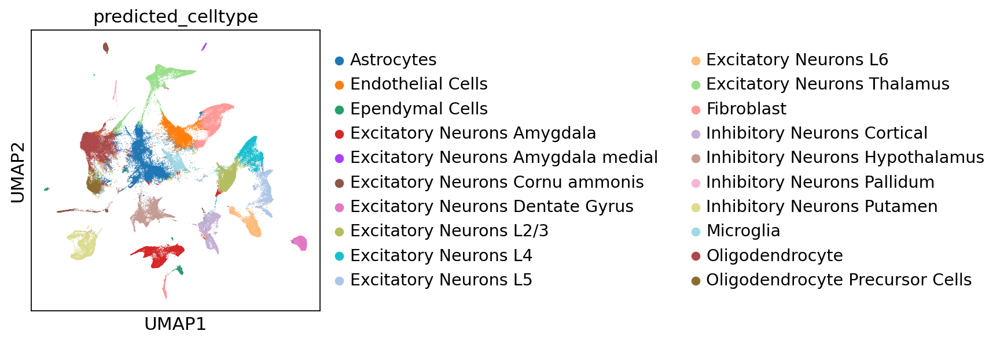

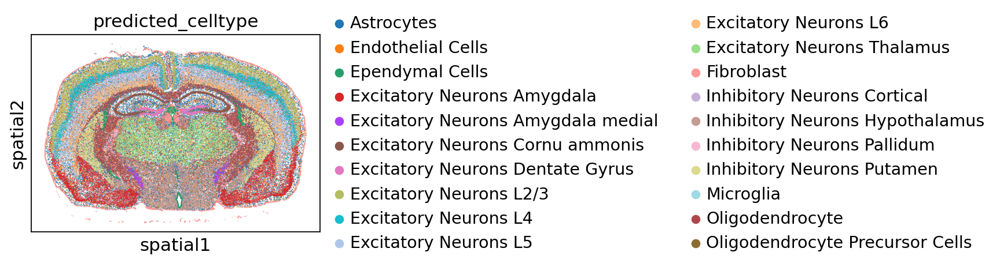

In [46]:
adata.obsm["X_umap"] = adata.obsm["X_umap_transferred"]
sc.pl.umap(adata, color="predicted_celltype")
sc.pl.spatial(adata, color="predicted_celltype", spot_size=30)

In [47]:
adata.obs["predicted_celltype"].value_counts()

predicted_celltype
Astrocytes                            17315
Oligodendrocyte                       14567
Fibroblast                            10070
Endothelial Cells                      9775
Inhibitory Neurons Hypothalamus        9284
Excitatory Neurons Amygdala            8640
Excitatory Neurons Thalamus            7947
Excitatory Neurons L5                  7004
Excitatory Neurons L2/3                6393
Inhibitory Neurons Putamen             5753
Inhibitory Neurons Cortical            5711
Excitatory Neurons L4                  5500
Excitatory Neurons L6                  5052
Microglia                              4141
Oligodendrocyte Precursor Cells        3872
Excitatory Neurons Dentate Gyrus       3283
Excitatory Neurons Cornu ammonis       2787
Ependymal Cells                        2202
Inhibitory Neurons Pallidum             658
Excitatory Neurons Amygdala medial      650
Name: count, dtype: int64

We use this dataset to set up a semisupervised and an unsupervised model in resolVI and train these. We split the dataset into right and left hemisphere to demonstrate query mapping.

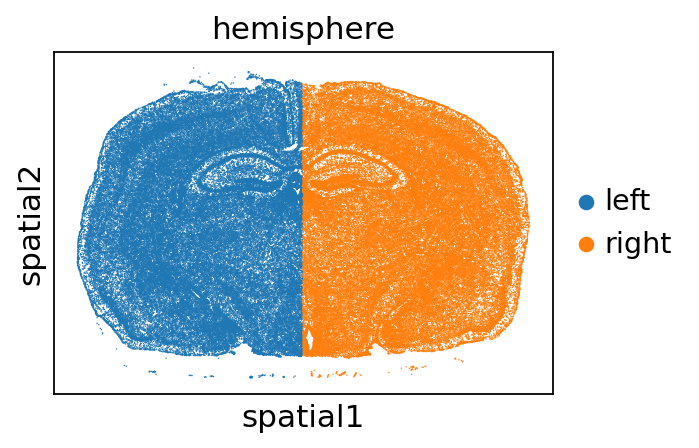

In [7]:
adata.obs["hemisphere"] = ["right" if x > 5000 else "left" for x in adata.obsm["X_spatial"][:, 0]]
sc.pl.spatial(adata, color="hemisphere", spot_size=30)

In [8]:
ref_adata = adata[adata.obs["hemisphere"] == "left"].copy()
query_adata = adata[adata.obs["hemisphere"] == "right"].copy()

## Train resolVI model

As in the scANVI notebook, we need to register the AnnData object for use in resolVI. Namely, we can ignore the batch parameter because those cells don't have much batch effect to begin with as they are derived from a single slice. However, we will give the celltype labels for resolVI to use. Setting up AnnData computes spatial neighbors within each batch. This step might take minutes for very large datasets. It is important that different slices are used as batch covariate.

In [9]:
scvi.external.RESOLVI.setup_anndata(ref_adata, labels_key="predicted_celltype", layer="counts")

/home/access/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:700: FutureWarning: `transformer='rapids'` is deprecated. Use `rapids_singlecell.tl.neighbors` instead.
  warn(msg, FutureWarning)


INFO     Generating sequential column names                                                                        
INFO     Generating sequential column names                                                                        


/home/access/.conda/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


In [10]:
supervised_resolvi = scvi.external.RESOLVI(ref_adata, semisupervised=True)

We use here only 20 epochs to speed up running the tutorial. We would recommend using 100 epochs here.

In [11]:
supervised_resolvi.train(max_epochs=50)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/access/.conda/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
You are using a CUDA device ('NVIDIA RTX 6000 Ada Generation') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/access/.conda/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers

Training:   0%|          | 0/50 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


`Trainer.fit` stopped: `max_epochs=50` reached.


Now we can predict the cell type labels using the trained model, and get the latent space.
ResolVI uses pyro. Pyro stores parameters in a pyro_param_store. It is necessary that only a single model is used at a time, e.g. after query training only the query model is valid and the reference model gets overwritten.

In [12]:
ref_adata

AnnData object with n_obs × n_vars = 66457 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype', 'hemisphere', '_indices', '_scvi_batch', '_scvi_ind_x', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p', 'predicted_celltype_colors', 'hemisphere_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred', 'X_umap', 'index_neighbor', 'distance_neighbor'
    layers: 'counts'

In [13]:
ref_adata.obsm["resolvi_celltypes"] = supervised_resolvi.predict(
    ref_adata, num_samples=3, soft=True
)

Sampling local variables, batch:   0%|          | 0/133 [00:00<?, ?it/s]

In [14]:
ref_adata.obs["resolvi_predicted"] = ref_adata.obsm["resolvi_celltypes"].idxmax(axis=1)
ref_adata.obsm["X_resolVI"] = supervised_resolvi.get_latent_representation(ref_adata)

Again, we may visualize the latent space as well as the inferred labels

In [15]:
sc.pp.neighbors(ref_adata, use_rep="X_resolVI")
sc.tl.umap(ref_adata)

In [16]:
ref_adata

AnnData object with n_obs × n_vars = 66457 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype', 'hemisphere', '_indices', '_scvi_batch', '_scvi_ind_x', '_scvi_labels', 'resolvi_predicted'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p', 'predicted_celltype_colors', 'hemisphere_colors', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred', 'X_umap', 'index_neighbor', 'distance_neighbor', 'resolvi_celltypes', 'X_resolVI'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

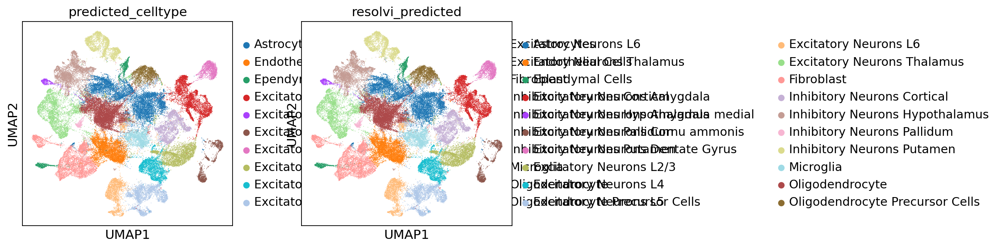

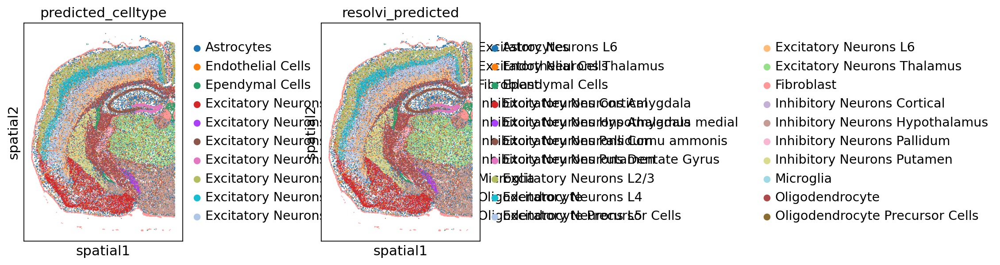

In [17]:
sc.pl.umap(ref_adata, color=["predicted_celltype", "resolvi_predicted"])
sc.pl.spatial(ref_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)

We can use the trained model to perform differential expression of two groups of cells. We compute here genes differentially expressed between neurons in two distinct layers. This uses a similar test to the scVI DE test. Please keep in mind this test doesn't test for differences in the mean between two groups but tests for differences between random pairs of single cell.

In [18]:
de_result_importance = supervised_resolvi.differential_expression(
    ref_adata,
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L6",
    group2="Excitatory Neurons L5",
    weights="importance",
    pseudocounts=1e-2,
    delta=0.05,
    filter_outlier_cells=True,
    mode="change",
    test_mode="three",
)
de_result_importance.head(5)

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Tle4,0.9958,0.0042,5.468460,0.028078,0.006143,0.01,0.05,2.379082,2.460799,0.828706,...,7.875953,2.030373,0.979060,0.719114,257.871887,58.038486,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Gadd45a,0.9944,0.0056,5.179371,0.017432,0.003308,0.01,0.05,2.446918,2.469673,0.871799,...,5.266322,1.189719,0.903200,0.518603,169.826843,32.502850,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Foxp2,0.9936,0.0064,5.045035,0.012354,0.001021,0.01,0.05,3.778523,3.829400,1.406031,...,3.196361,0.399037,0.813908,0.262425,102.339798,11.177025,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Nell1,0.9932,0.0068,-4.984008,0.000707,0.006636,0.01,0.05,-3.173012,-3.227477,0.999305,...,0.323192,2.671095,0.239431,0.650667,10.864615,69.391838,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Bdnf,0.9838,0.0162,-4.106411,0.000825,0.009664,0.01,0.05,-3.287954,-3.322028,1.326788,...,0.500592,3.026376,0.295930,0.672252,15.982127,84.273277,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5


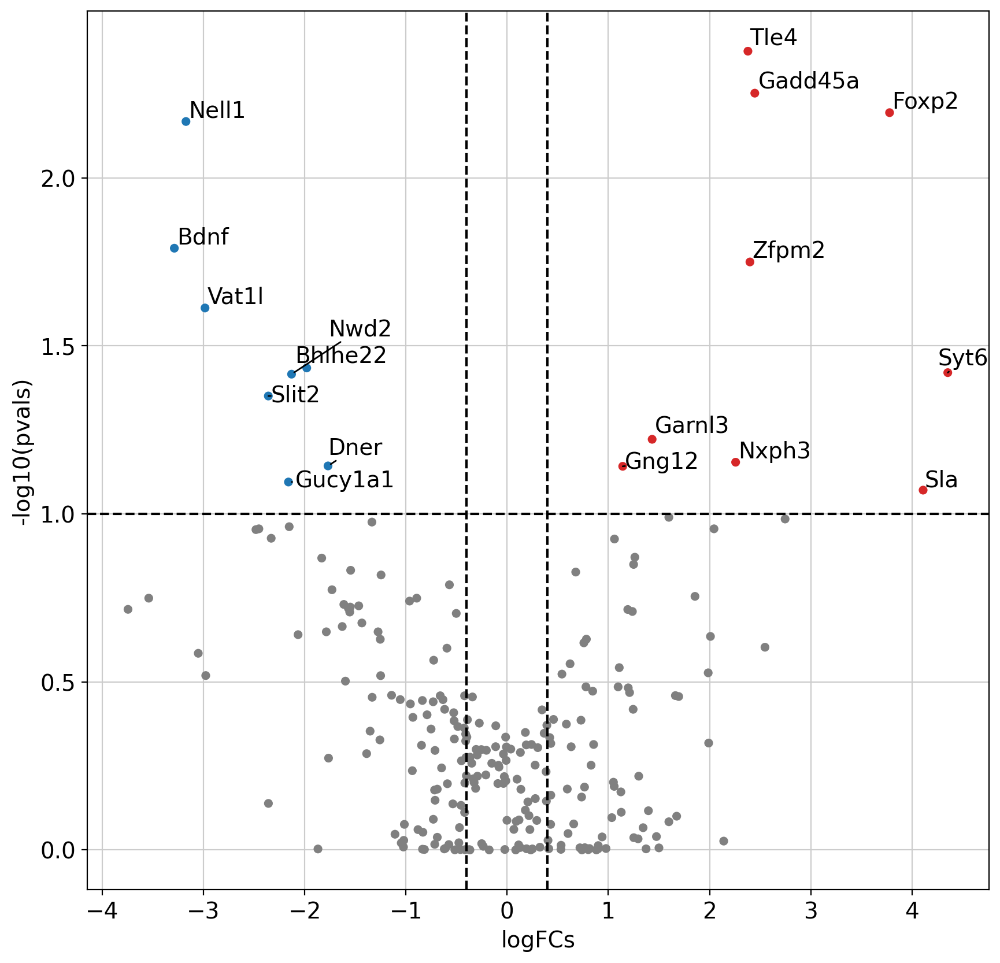

In [19]:
dc.plot_volcano_df(
    de_result_importance,
    x="lfc_mean",
    y="proba_not_de",
    sign_thr=0.1,
    lFCs_thr=0.4,
    top=30,
    figsize=(10, 10),
)
plt.show()

We can use the trained model to perform differential abundance of cell states in the neighborhood of two groups of cells. We find here that excitatory neurons in thalamus and cortex preferentially colocalize with themselves as well as adjacent layer neurons. This uses a similar test to the scVI DE test.

In [20]:
da = supervised_resolvi.differential_niche_abundance(
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L4",
    group2="Excitatory Neurons Thalamus",
    neighbor_key="index_neighbor",
    test_mode="three",
    delta=0.05,
    pseudocounts=3e-2,
)
da.head(5)

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Sampling local variables, batch:   0%|          | 0/22 [00:00<?, ?it/s]

Sampling local variables, batch:   0%|          | 0/32 [00:00<?, ?it/s]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,is_de_fdr_0.05,comparison,group1,group2
Excitatory Neurons Thalamus,0.9972,0.0028,-5.875328,0.001980,0.527142,0.03,0.05,-11.394114,-12.393059,2.863338,-14.868810,7.292531,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L4,0.9942,0.0058,5.144079,0.478554,0.000736,0.03,0.05,11.724375,12.036836,1.962587,-2.988526,14.879125,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L2/3,0.8864,0.1136,2.054485,0.078125,0.000040,0.03,0.05,8.319235,8.197361,3.140490,-4.544894,14.637014,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L5,0.6512,0.3488,0.624318,0.050832,0.000098,0.03,0.05,6.270683,6.062303,4.025794,-5.788933,14.485220,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Oligodendrocyte,0.6474,0.3526,-0.607630,0.022201,0.084171,0.03,0.05,-5.113423,-5.379434,6.368150,-14.490676,12.332048,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus


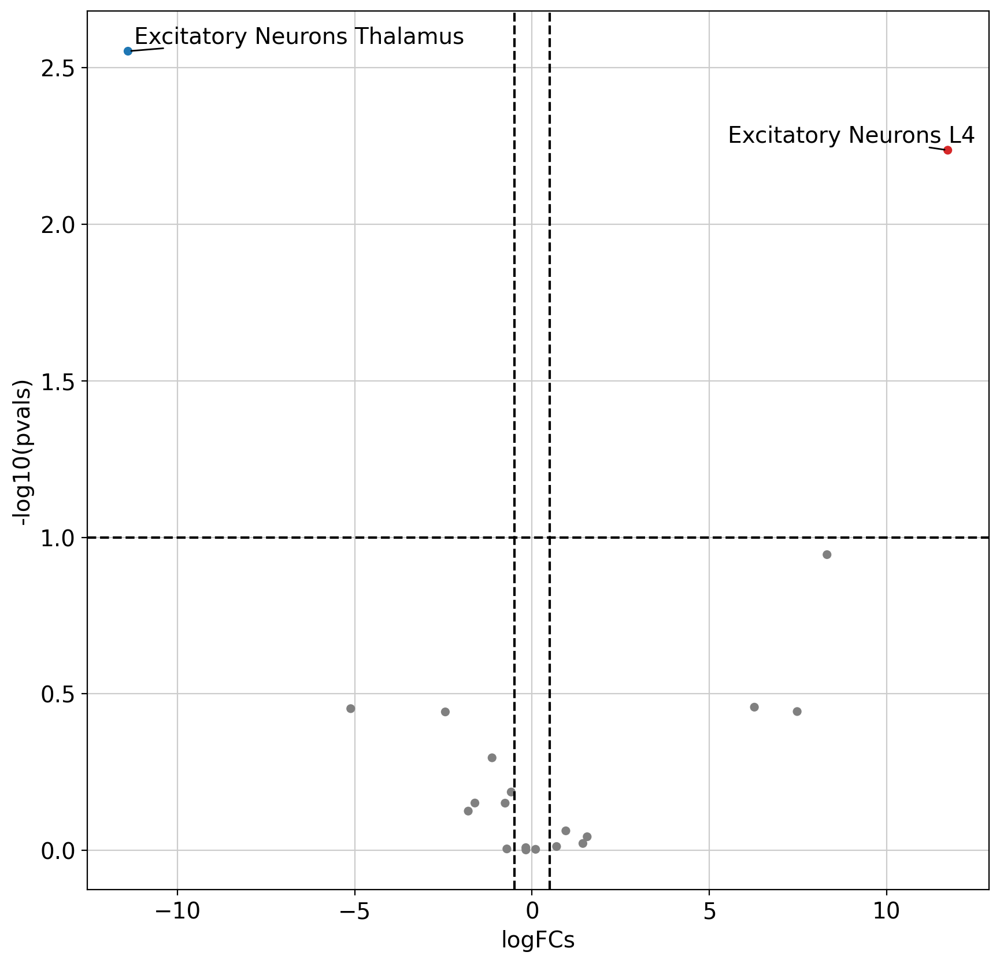

In [21]:
dc.plot_volcano_df(
    da,
    x="lfc_mean",
    y="proba_not_de",
    sign_thr=0.1,
    lFCs_thr=0.5,
    top=30,
    figsize=(10, 10),
)
plt.show()

We can also generate counts that are corrected for counts from neighboring cells wrongly assigned due to missegmentation as well as unspecific background. We use custom parameters for num_samples and and summary_fun to accelerate computation. "px_rate" of model_corrected generates corrected count data. "mixture_proportions" of model_residuals generates the amount of diffusion and background for each cell. Batch steps defines how many batches are accumulated before computing summary statistics.
To increase the amount of correction, use lower quantiles instead of median.

In [22]:
import pandas as pd

In [23]:
samples_corr = supervised_resolvi.sample_posterior(
    model=supervised_resolvi.module.model_corrected,
    return_sites=["px_rate"],
    summary_fun={"post_sample_q50": np.median},
    num_samples=3,
    summary_frequency=30,
)
samples_corr = pd.DataFrame(samples_corr).T

Sampling local variables, batch:   0%|          | 0/520 [00:00<?, ?it/s]

In [24]:
samples = supervised_resolvi.sample_posterior(
    model=supervised_resolvi.module.model_residuals,
    return_sites=["mixture_proportions"],
    summary_fun={"post_sample_means": np.mean},
    num_samples=3,
    summary_frequency=100,
)
samples = pd.DataFrame(samples).T

Sampling local variables, batch:   0%|          | 0/520 [00:00<?, ?it/s]

In [25]:
ref_adata.obs[["true_proportion", "diffusion_proportion", "background_proportion"]] = samples.loc[
    "post_sample_means", "mixture_proportions"
]

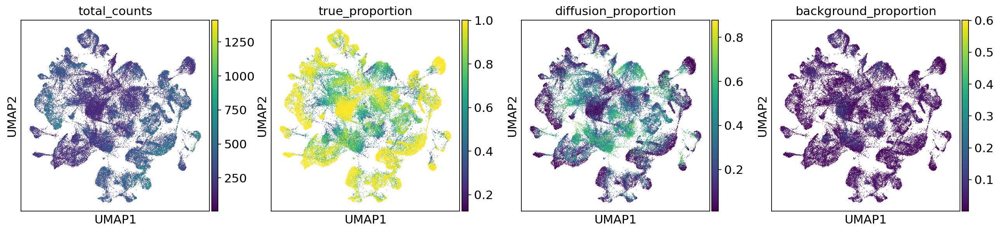

In [26]:
sc.pl.umap(
    ref_adata,
    color=["total_counts", "true_proportion", "diffusion_proportion", "background_proportion"],
)

In [27]:
ref_adata.layers["generated_expression"] = samples_corr.loc["post_sample_q50", "px_rate"]

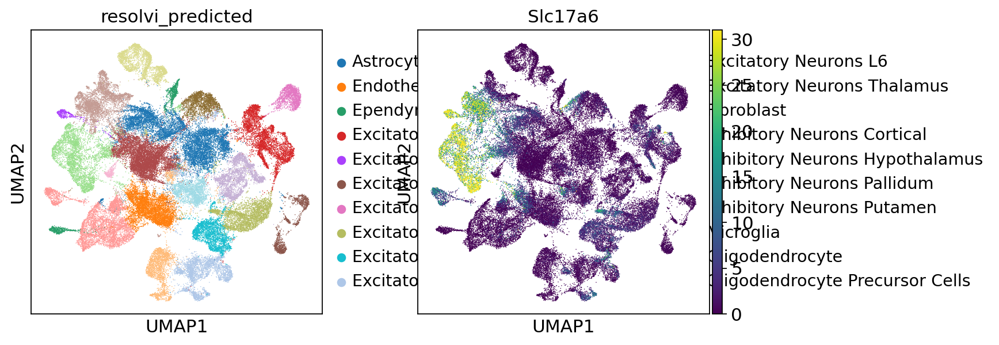

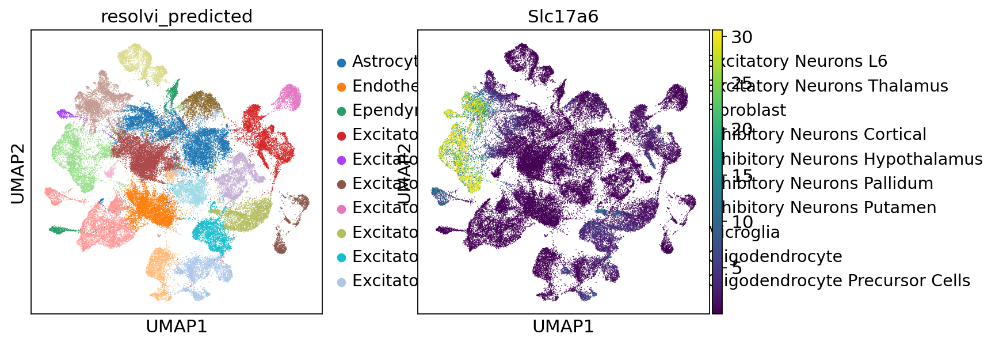

In [28]:
sc.pl.umap(ref_adata, color=["resolvi_predicted", "Slc17a6"], layer="counts", vmax="p98")
sc.pl.umap(
    ref_adata, color=["resolvi_predicted", "Slc17a6"], layer="generated_expression", vmax="p98"
)

## Query transfer
We can train the reference model on query data to reannotate this data. We rely on the observation names for non-amortized parameters in resolVI. It is important to make sure cells have unique names between query and reference dataset. We set the cell-type to unknown, so that resolVI needs to predict the celltype leveraging the reference model.

In [29]:
query_adata.obs["predicted_celltype"] = "unknown"
query_adata.obs_names = [f"query_{i}" for i in query_adata.obs_names]

In [30]:
supervised_resolvi.prepare_query_anndata(query_adata, reference_model=supervised_resolvi)
query_resolvi = supervised_resolvi.load_query_data(query_adata, reference_model=supervised_resolvi)

INFO     Found 100.0% reference vars in query data.                                                                


/home/access/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:700: FutureWarning: `transformer='rapids'` is deprecated. Use `rapids_singlecell.tl.neighbors` instead.
  warn(msg, FutureWarning)
/home/access/.conda/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 66457 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(


In [31]:
query_resolvi.train(max_epochs=20)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/access/.conda/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Running scArches. Set lr to 0 and blocking variables.


/home/access/.conda/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training:   0%|          | 0/20 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [32]:
query_adata.obs["resolvi_predicted"] = query_resolvi.predict(
    query_adata, num_samples=3, soft=False
)
query_adata.obsm["X_resolVI"] = query_resolvi.get_latent_representation(query_adata)

Sampling local variables, batch:   0%|          | 0/129 [00:00<?, ?it/s]

Again, we may visualize the latent space as well as the inferred labels

In [33]:
sc.pp.neighbors(query_adata, use_rep="X_resolVI")
sc.tl.umap(query_adata)

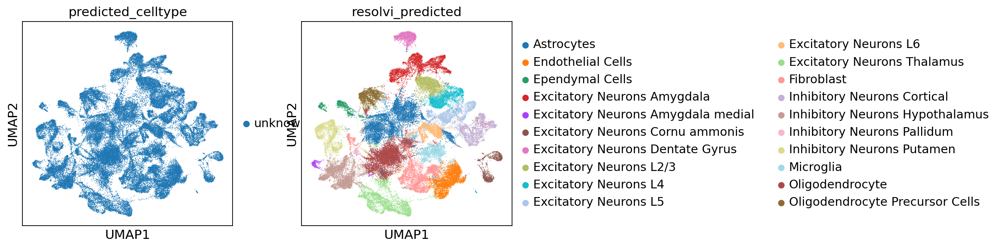

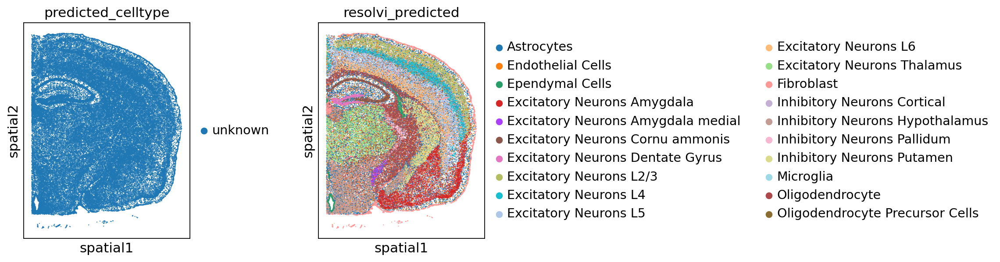

In [34]:
sc.pl.umap(query_adata, color=["predicted_celltype", "resolvi_predicted"])
sc.pl.spatial(query_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)

We can now concatenate the datasets again and find good integration and accurate cell-type information.

In [35]:
full_adata = ref_adata.concatenate(
    query_adata, batch_key="source", batch_categories=["reference", "query"]
)

/tmp/ipykernel_79406/1142808005.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  full_adata = ref_adata.concatenate(


In [36]:
sc.pp.neighbors(full_adata, use_rep="X_resolVI")
sc.tl.umap(full_adata)

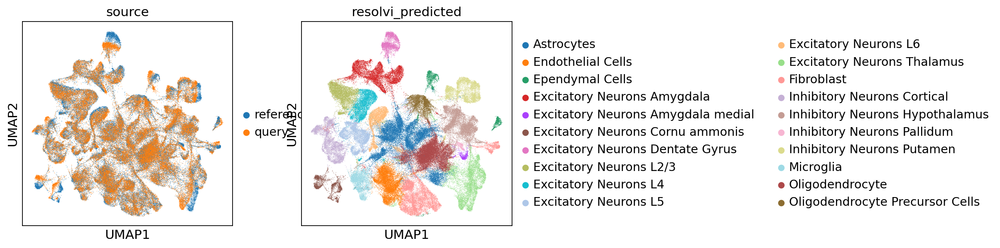

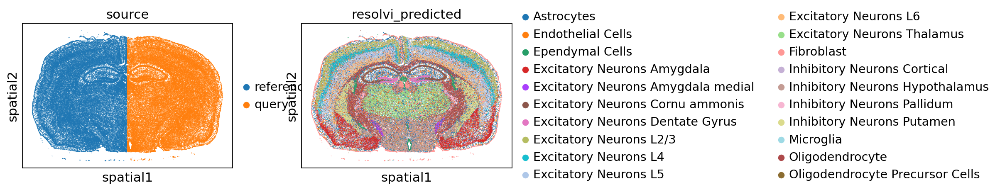

In [37]:
sc.pl.umap(full_adata, color=["source", "resolvi_predicted"])
sc.pl.spatial(full_adata, color=["source", "resolvi_predicted"], spot_size=30)